#**Synapse Detection**

#Introduction

A synapse is a structure in the nervous system that allows two neuron cells to communicate with each other. The cells pass chemical or electrical signals through the synapse via the synaptic cleft, which is the empty space between two adjacent cells.

Detecting synapses is important because it helps us construct more accurate models of the brain that will alllow us to further examine the relationship between brain function and structure. This work is part of the larger field of connectomics, which is the study of the maps of an organism's nervous system, also called it's connectome.

This tutorial will walk you through the step by step processes of how to train and implement a synaptic detection model that automates the detection of synapses in mouse brain images.

In [ ]:
# IMPORTANT - Make sure Runtime is set to GPU!

First, make sure your Google Colab Runtime type is set to GPU.

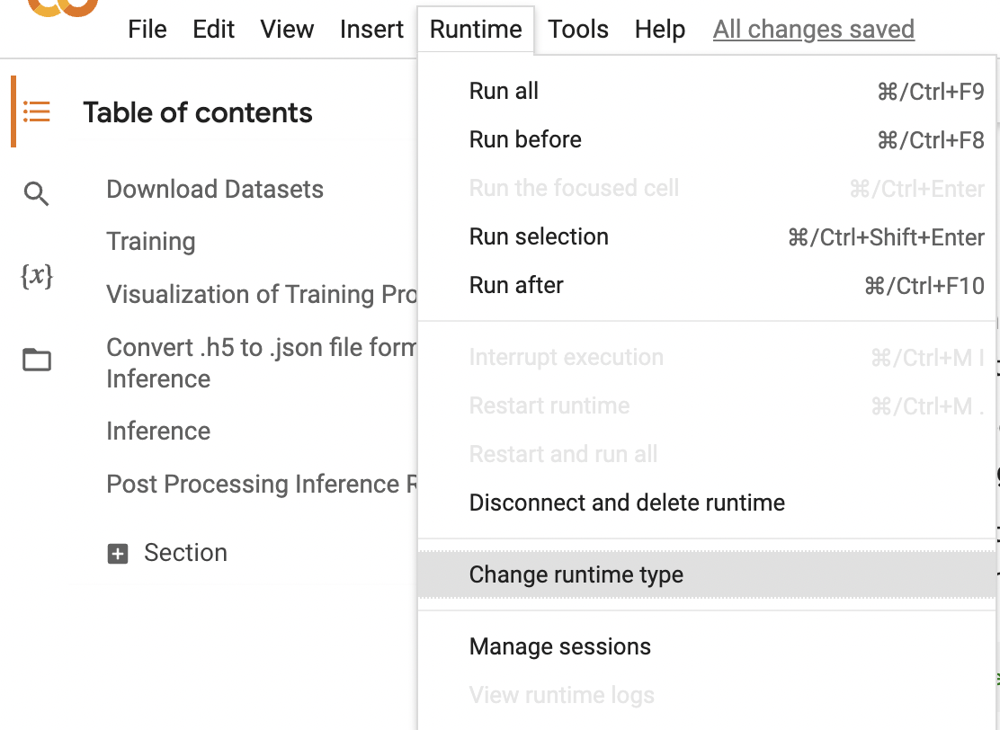


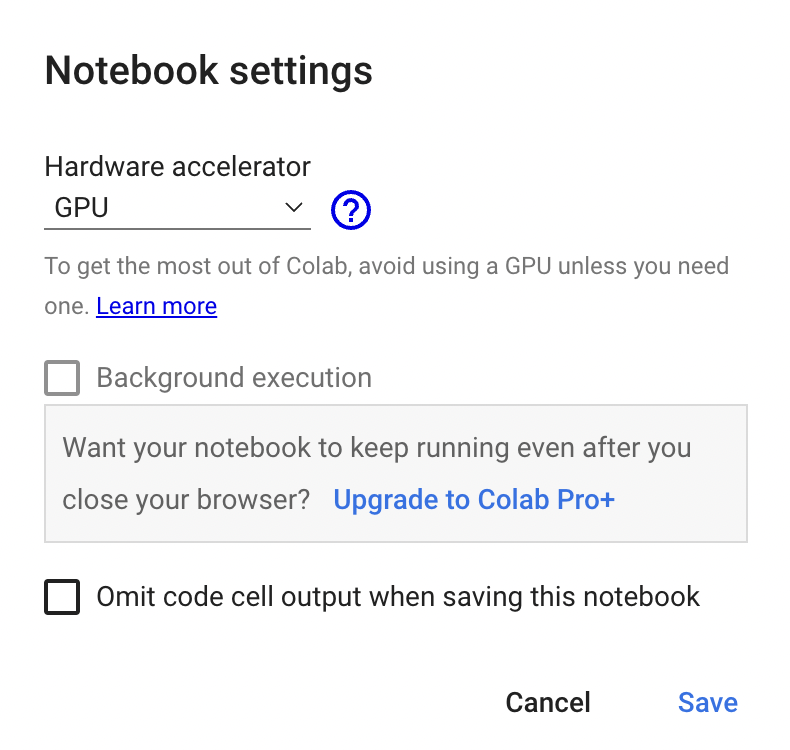

# Download Datasets

Our data comes from Google Drive so we are using the gdown package to download this data to the Colab file system. Replace with your own Google Drive file link or other data source. 

In [1]:
# Download training data sets
! pip install gdown
! gdown 'https://drive.google.com/uc?id=1cJM-tX6eOG-_SGdjA3s9l2ZwmtF84Tyn' -O data_syn.h5
! gdown 'https://drive.google.com/uc?id=1mYF2rAbRInOz_LLYXA5ha1PcrlqCF9Le' -O data_img.h5

Downloading...
From: https://drive.google.com/uc?id=1cJM-tX6eOG-_SGdjA3s9l2ZwmtF84Tyn
To: /content/data_syn.h5
100% 1.90M/1.90M [00:00<00:00, 41.2MB/s]
Downloading...
From: https://drive.google.com/uc?id=1mYF2rAbRInOz_LLYXA5ha1PcrlqCF9Le
To: /content/data_img.h5
100% 369M/369M [00:02<00:00, 144MB/s]


In [2]:
# Clone the Github
! git clone https://github.com/ryanraff43/pytorch_connectomics.git


Cloning into 'pytorch_connectomics'...
remote: Enumerating objects: 10902, done.
remote: Counting objects: 100% (2168/2168), done.
remote: Compressing objects: 100% (843/843), done.
remote: Total 10902 (delta 1332), reused 2026 (delta 1278), pack-reused 8734
Receiving objects: 100% (10902/10902), 84.85 MiB | 24.40 MiB/s, done.
Resolving deltas: 100% (7011/7011), done.


In [3]:
# Set current directory and install necessary packages
! cd pytorch_connectomics && pip install --editable .

Obtaining file:///content/pytorch_connectomics
     |████████████████████████████████| 38.1 MB 1.3 MB/s 
     |████████████████████████████████| 60.5 MB 1.2 MB/s 
     |████████████████████████████████| 11.2 MB 37.4 MB/s 
     |████████████████████████████████| 2.0 MB 37.2 MB/s 
     |████████████████████████████████| 3.4 MB 30.2 MB/s 
     |████████████████████████████████| 562 kB 41.3 MB/s 
     |████████████████████████████████| 4.3 MB 33.8 MB/s 
     |████████████████████████████████| 930 kB 30.7 MB/s 
     |████████████████████████████████| 462 kB 46.1 MB/s 
  Created wheel for imgaug: filename=imgaug-0.2.5-py3-none-any.whl size=561438 sha256=2adbfd59b143fcc6eadd02af2e0fc1afe2433235931268e038041b736a2c9ccc
  Stored in directory: /root/.cache/pip/wheels/60/dd/38/d1dc2cad2b6a66dc0249261004990bccb0f27985c74ba26e49
  Created wheel for gputil: filename=GPUtil-1.4.0-py3-none-any.whl size=7411 sha256=fcbc0f929b30fac0da48d48d8fbfbde87413381ec0a2f116c4e71dceebd3ffef
  Stored in directory: 

#Training

This command trains the model based on the input data. This command may take a long time to run depending on how many training iterations you choose to use. The YAML file is set to 200 iterations by default which should take about 5 minutes. 

In [5]:
# Training command
# Can change iterations and CPUs/GPUs by editing YAML file
# Default set to 200 iterations which takes about 5 mins

! python -u /content/pytorch_connectomics/scripts/main.py \
--config-base /content/pytorch_connectomics/configs/JWR15/synapse/JWR15-Synapse-Base.yaml \
--config-file /content/pytorch_connectomics/configs/JWR15/synapse/JWR15-Synapse-BCE-DICE-Regu.yaml

rank: None, device: cuda, seed: 0
PyTorch:  1.11.0+cu113
AUGMENTOR:
  ADDITIONAL_TARGETS_NAME: ['label']
  ADDITIONAL_TARGETS_TYPE: ['mask']
  COPYPASTE:
    AUG_THRES: 0.7
    ENABLED: False
    P: 0.8
    SKIP: []
  CUTBLUR:
    DOWNSAMPLE_Z: False
    DOWN_RATIO_MAX: 8.0
    DOWN_RATIO_MIN: 2.0
    ENABLED: True
    LENGTH_RATIO: 0.4
    P: 0.5
    SKIP: []
  CUTNOISE:
    ENABLED: True
    LENGTH_RATIO: 0.4
    P: 0.75
    SCALE: 0.3
    SKIP: []
  ELASTIC:
    ALPHA: 16.0
    ENABLED: True
    P: 0.75
    SIGMA: 4.0
    SKIP: []
  ENABLED: True
  FLIP:
    DO_ZTRANS: 0
    ENABLED: True
    P: 1.0
    SKIP: []
  GRAYSCALE:
    ENABLED: True
    P: 0.75
    SKIP: []
  MISALIGNMENT:
    DISPLACEMENT: 16
    ENABLED: True
    P: 0.5
    ROTATE_RATIO: 0.5
    SKIP: []
  MISSINGPARTS:
    ENABLED: True
    ITER: 64
    P: 0.9
    SKIP: []
  MISSINGSECTION:
    ENABLED: True
    NUM_SECTION: 2
    P: 0.5
    SKIP: []
  MOTIONBLUR:
    ENABLED: True
    KERNEL_SIZE: 11
    P: 0.5
    SEC

# Visualization of Training Process

In [6]:
%load_ext tensorboard
# might have to use --load_fast=false after file path if below line isn't working
%tensorboard --logdir outputs/JWR15_Syn_BCE_DICE_Regu/ --load_fast=false

<IPython.core.display.Javascript object>

# Convert .h5 to .json file format for Inference

These functions and imports convert the data_img.h5 file to a .json file format, for the next inference section to use as the IMAGE_NAME.

In [7]:
import os
import h5py
import math
import glob
import numpy as np
import imageio

from typing import Optional, List
from google.colab import files

def create_json(ndim: int = 1, dtype: str = "uint8", data_path: str = "/content/data_img.h5",
                height: int = 10000, width: int = 10000, depth: int = 500,
                n_columns: int = 3, n_rows: int = 3, tile_size: int = 4096,
                tile_ratio: int = 1, tile_st: List[int] = [0, 0]):
    """Create a dictionay to store the metadata for large volumes. The dictionary is
    usually saved as a JSON file and can be read by the TileDataset.
    Args:
        ndim (int, optional): [description]. Defaults to 1.
        dtype (str, optional): [description]. Defaults to "uint8".
        data_pathLstr (str, optional): [description]. Defaults to "/path/to/data".
        height (int, optional): [description]. Defaults to 10000.
        width (int, optional): [description]. Defaults to 10000.
        depth (int, optional): [description]. Defaults to 500.
        tile_ratio (int, optional): [description]. Defaults to 1.
        n_columns (int, optional): [description]. Defaults to 3.
        n_rows (int, optional): [description]. Defaults to 3.
        tile_size (int, optional): [description]. Defaults to 4096.
        tile_ratio (int, optional): [description]. Defaults to 1.
        tile_st (List[int], optional): [description]. Defaults to [0,0].
    """
    metadata = {}
    metadata["ndim"] = ndim
    metadata["dtype"] = dtype

    digits = int(math.log10(depth))+1
    metadata["image"] = [
        data_path + str(i).zfill(digits) + r"/{row}{column}.png"
        for i in range(depth)]

    metadata["height"] = height
    metadata["width"] = width
    metadata["depth"] = depth

    metadata["n_columns"] = n_columns
    metadata["n_rows"] = n_rows

    metadata["tile_size"] = tile_size
    metadata["tile_ratio"] = tile_ratio
    metadata["tile_st"] = tile_st

    return metadata

data_json = create_json()

In [8]:
import json
with open('data_img.json', 'w') as json_file:
  json.dump(data_json, json_file)

# Inference

This command runs inference on the specified images labeled under IMAGE_NAME in the JWR15-Synapse-Base.yaml file. Insert a checkpoint from the training output with file ending .tar. Uses the same YAML configuration files as the training command. 

In [9]:
# edit IMAGE_NAME (in the INFERENCE section of the JWR15-Synapse-Base.yaml file) to be 'data_img.json' or the name of your JSON file
# edit checkpoint file path to be a .tar checkpoint from the training section

! python -u /content/pytorch_connectomics/scripts/main.py \
--inference --config-base /content/pytorch_connectomics/configs/JWR15/synapse/JWR15-Synapse-Base.yaml \
--config-file /content/pytorch_connectomics/configs/JWR15/synapse/JWR15-Synapse-BCE-DICE-Regu.yaml \
--checkpoint outputs/JWR15_Syn_BCE_DICE_Regu/checkpoint_00200.pth.tar

rank: None, device: cuda, seed: 0
PyTorch:  1.11.0+cu113
AUGMENTOR:
  ADDITIONAL_TARGETS_NAME: ['label']
  ADDITIONAL_TARGETS_TYPE: ['mask']
  COPYPASTE:
    AUG_THRES: 0.7
    ENABLED: False
    P: 0.8
    SKIP: []
  CUTBLUR:
    DOWNSAMPLE_Z: False
    DOWN_RATIO_MAX: 8.0
    DOWN_RATIO_MIN: 2.0
    ENABLED: True
    LENGTH_RATIO: 0.4
    P: 0.5
    SKIP: []
  CUTNOISE:
    ENABLED: True
    LENGTH_RATIO: 0.4
    P: 0.75
    SCALE: 0.3
    SKIP: []
  ELASTIC:
    ALPHA: 16.0
    ENABLED: True
    P: 0.75
    SIGMA: 4.0
    SKIP: []
  ENABLED: True
  FLIP:
    DO_ZTRANS: 0
    ENABLED: True
    P: 1.0
    SKIP: []
  GRAYSCALE:
    ENABLED: True
    P: 0.75
    SKIP: []
  MISALIGNMENT:
    DISPLACEMENT: 16
    ENABLED: True
    P: 0.5
    ROTATE_RATIO: 0.5
    SKIP: []
  MISSINGPARTS:
    ENABLED: True
    ITER: 64
    P: 0.9
    SKIP: []
  MISSINGSECTION:
    ENABLED: True
    NUM_SECTION: 2
    P: 0.5
    SKIP: []
  MOTIONBLUR:
    ENABLED: True
    KERNEL_SIZE: 11
    P: 0.5
    SEC

# Post Processing Inference Results

Setting up a few functions to read and write .h5 files, which will then run polarity2instance() on the .h5 inference outputs from the previous inference section. This will interpret the 3-channel probability map which is contained in the .h5 file. Functions come from the PyTorch Connectomics package. 

In [10]:
# polarity2instance() function, to interpret inference results
# other read/write volume functions to process inference results

from __future__ import print_function, division
from typing import Optional, Union, List
import numpy as np

from scipy import ndimage
from skimage.measure import label
from skimage.transform import resize
from skimage.morphology import dilation
from skimage.segmentation import watershed
from skimage.morphology import remove_small_objects

def getSegType(mid):
    # reduce the label dtype
    m_type = np.uint64
    if mid < 2**8:
        m_type = np.uint8
    elif mid < 2**16:
        m_type = np.uint16
    elif mid < 2**32:
        m_type = np.uint32
    return m_type

def cast2dtype(segm):
    """Cast the segmentation mask to the best dtype to save storage.
    """
    max_id = np.amax(np.unique(segm))
    m_type = getSegType(int(max_id))
    return segm.astype(m_type)

def polarity2instance(volume, thres=0.5, thres_small=128,
                      scale_factors=(1.0, 1.0, 1.0), semantic=False):
    r"""From synaptic polarity prediction to instance masks via connected-component
    labeling. The input volume should be a 3-channel probability map of shape :math:`(C, Z, Y, X)`
    where :math:`C=3`, representing pre-synaptic region, post-synaptic region and their
    union, respectively.
    Note:
        For each pair of pre- and post-synaptic segmentation, the decoding function will
        annotate pre-synaptic region as :math:`2n-1` and post-synaptic region as :math:`2n`,
        for :math:`n>0`. If :attr:`semantic=True`, all pre-synaptic pixels are labeled with
        while all post-synaptic pixels are labeled with 2. Both kinds of annotation are compatible
        with the ``TARGET_OPT: ['1']`` configuration in training.
    Note:
        The number of pre- and post-synaptic segments will be reported when setting :attr:`semantic=False`.
        Note that the numbers can be different due to either incomplete syanpses touching the volume borders,
        or errors in the prediction. We thus make a conservative estimate of the total number of synapses
        by using the relatively small number among the two.
    Args:
        volume (numpy.ndarray): 3-channel probability map of shape :math:`(3, Z, Y, X)`.
        thres (float): probability threshold of foreground. Default: 0.5
        thres_small (int): size threshold of small objects to remove. Default: 128
        scale_factors (tuple): scale factors for resizing the output volume in :math:`(Z, Y, X)` order. Default: :math:`(1.0, 1.0, 1.0)`
        semantic (bool): return only the semantic mask of pre- and post-synaptic regions. Default: False
    Examples::
        >>> from connectomics.data.utils import readvol, savevol
        >>> from connectomics.utils.processing import polarity2instance
        >>> volume = readvol(input_name)
        >>> instances = polarity2instance(volume)
        >>> savevol(output_name, instances)
    """
    thres = int(255.0 * thres)
    temp = (volume > thres).astype(np.uint8)

    syn_pre = temp[0] * temp[2]
    syn_pre = remove_small_objects(syn_pre,
                min_size=thres_small, connectivity=1)
    syn_post = temp[1] * temp[2]
    syn_post = remove_small_objects(syn_post,
                min_size=thres_small, connectivity=1)

    if semantic:
        # Generate only the semantic mask. The pre-synaptic region is labeled
        # with 1, while the post-synaptic region is labeled with 2.
        segm = np.maximum(syn_pre.astype(np.uint8),
                          syn_post.astype(np.uint8) * 2)

    else:
        # Generate the instance mask.
        foreground = dilation(temp[2].copy(), np.ones((1,5,5)))
        foreground = label(foreground)

        # Since non-zero pixels in seg_pos and seg_neg are subsets of temp[2],
        # they are naturally subsets of non-zero pixels in foreground.
        seg_pre = (foreground*2 - 1) * syn_pre.astype(foreground.dtype)
        seg_post = (foreground*2) * syn_post.astype(foreground.dtype)
        segm = np.maximum(seg_pre, seg_post)

        # Report the number of synapses
        num_syn_pre = len(np.unique(seg_pre))-1
        num_syn_post = len(np.unique(seg_post))-1
        num_syn = min(num_syn_pre, num_syn_post) # a conservative estimate
        print("Stats: found %d pre- and %d post-" % (num_syn_pre, num_syn_post) +
              "synaptic segments in the volume")
        print("There are %d synapses under a conservative estimate." % num_syn)

    # resize the segmentation based on specified scale factors
    if not all(x==1.0 for x in scale_factors):
        target_size = (int(segm.shape[0]*scale_factors[0]),
                       int(segm.shape[1]*scale_factors[1]),
                       int(segm.shape[2]*scale_factors[2]))
        segm = resize(segm, target_size, order=0, anti_aliasing=False, preserve_range=True)

    return cast2dtype(segm)

In [11]:
from __future__ import print_function, division
from typing import Optional, List

import os
import h5py
import math
import glob
import numpy as np
import imageio
from scipy.ndimage import zoom

def readvol(filename: str, dataset: Optional[str]=None, drop_channel: bool=False):
    r"""Load volumetric data in HDF5, TIFF or PNG formats.
    """
    img_suf = filename[filename.rfind('.')+1:]
    if img_suf in ['h5', 'hdf5']:
        data = readh5(filename, dataset)
    elif 'tif' in img_suf:
        data = imageio.volread(filename).squeeze()
        if data.ndim == 4:
            # convert (z,c,y,x) to (c,z,y,x) order
            data = data.transpose(1,0,2,3)
    elif 'png' in img_suf:
        data = readimgs(filename)
        if data.ndim == 4:
            # convert (z,y,x,c) to (c,z,y,x) order
            data = data.transpose(3,0,1,2)
    else:
        raise ValueError('unrecognizable file format for %s' % (filename))

    assert data.ndim in [3, 4], "Currently supported volume data should " + \
        "be 3D (z,y,x) or 4D (c,z,y,x), got {}D".format(data.ndim)
    if drop_channel and data.ndim == 4:
        # merge multiple channels to grayscale by average
        orig_dtype = data.dtype
        data = np.mean(data, axis=0).astype(orig_dtype)
 
    return data

def readh5(filename, dataset=None):
    fid = h5py.File(filename, 'r')
    if dataset is None:
        # load the first dataset in the h5 file
        dataset = list(fid)[0]
    return np.array(fid[dataset])

def writeh5(filename, dtarray, dataset='main'):
    fid = h5py.File(filename, 'w')
    if isinstance(dataset, (list,)):
        for i, dd in enumerate(dataset):
            ds = fid.create_dataset(
                dd, dtarray[i].shape, compression="gzip", dtype=dtarray[i].dtype)
            ds[:] = dtarray[i]
    else:
        ds = fid.create_dataset(dataset, dtarray.shape,
                                compression="gzip", dtype=dtarray.dtype)
        ds[:] = dtarray
    fid.close()

def savevol(filename, vol, dataset='main', format='h5'):
    if format == 'h5':
        writeh5(filename, vol, dataset='main')
    if format == 'png':
        currentDirectory = os.getcwd()
        img_save_path = os.path.join(currentDirectory, filename)
        if not os.path.exists(img_save_path):
            os.makedirs(img_save_path)
        for i in range(vol.shape[0]):
            imageio.imsave('%s/%04d.png' % (img_save_path, i), vol[i])

In [13]:
# change readvol('insert_your_h5_output.h5') for each iteration
# reads volume from h5 inference output, processes it and reports instances of synapse segmentation - saved to instance_output.h5 file

volume = readvol('/content/outputs/JWR15_Synapse/test/result_0-25-0-1428-5000-6250.h5')
instances = polarity2instance(volume)
savevol('instance_output.h5', instances)

Stats: found 0 pre- and 0 post-synaptic segments in the volume
There are 0 synapses under a conservative estimate.
